In [1]:
import numpy as np
import pandas as pd
import scipy
import matplotlib.pyplot as plt, seaborn as sns
import IPython.display as ipd
from sklearn import preprocessing

import librosa, librosa.display

plt.rcParams['figure.figsize'] = (10, 3)

# Introduction

What is musical audio features?

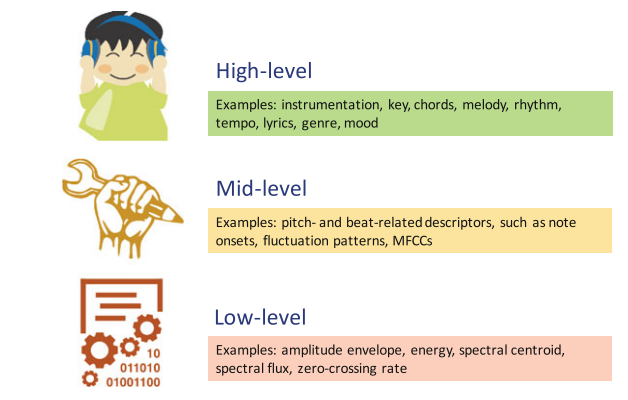

In [2]:
ipd.Image("img/f1.PNG")

"We use the term 'feature' to refer to a numerical (scalar, vector, or matrix) or nominal description of the music item under consideration, typically being the result of a feature extraction process. Feature extractors aim at transforming the raw data representing the music item into more descriptive representations, ideally describing musical aspects as perceived by humans, for instance, related to instrumentation, rhythmic structure, melody, or harmony."

- From: Knees, Peter, and Markus Schedl. Music similarity and retrieval: an introduction to audio-and web-based strategies. Vol. 9. Heidelberg: Springer, 2016.

## Librosa Features

**Features**

- Spectogram Features
    
    - Spectrogram features
        - **Spectral centroid**

        - **Spectral bandwidth** of p'th-order

        - **Spectral contrast**

        - **Spectral flatness**

        - **Spectral Roll-off frequency**

        - **Polynomial features**: Coefficients of fitting an nth-order polynomial to the columns of a spectrogram
        
    - Mel-scaled spectrogram
        - **Mel-frequency cepstral coefficients (MFCCs)**
        
- Chromagram Features

    - **Chromagram STFT**: A chromagram from a waveform or power spectrogram

    - **Constant-Q chromagram**

    - **Chroma Energy Normalized (CENS)**

- **Tonnetz**: The tonal centroid features (tonnetz)
    

- Energy features
    - **RMS**: Root-mean-square (RMS) value for each frame, either from the audio samples `y` or from a spectrogram `S`

    - **Zero crossing rate:** The zero-crossing rate of an audio time series

- Rhythm features
    - **Onset envelop**
    - **Tempo**: the tempo (beats per minute)
    - **Tempogram**: local autocorrelation of the onset strength envelope
    - **Tempogram Ratio**: also known as spectral rhythm patterns

---

**Decomposition**
- Median-filtering **harmonic percussive source separation** (HPSS)

---
**Feature Statistics for feature vectors**

- Mean
- Standard Deviation
- Skewness
- Kurtosis

- Minimum Value
- Maximum Value

In [3]:
def df_stats(df):
    cols_=['mean','std','skew','kurt','max','min','count']
    out_df = pd.concat([df.mean(), df.std(), df.skew(), df.kurt(),
                        df.max(), df.min(), df.count()], axis=1)
    out_df.columns = cols_
    return out_df

## Feature Extraction

1. First, an audio is decomposed to harmonic part and percussive part. Then we have three audio(signal) time series `y`.

2. For each time series (`y`, `y_harm`, `y_perc`), compute features introduced above.

3. The features can be a scalar, a vector, or a matrix. In the case of the feature vectors, we generate mean, standard deviaton, skewness and kurtosis, or max of min value of each feature vector.

# Audio Example

Let's look at an example of a single audio wav file.

In [4]:
path_audio = "data/example1.mp3"

In [5]:
path_audio = "data/Endless/12. Slide on Me.mp3"

In [6]:
y, sr = librosa.load(path_audio, duration=30, offset=30)
y = librosa.effects.trim(y)[0] # check if there is silence before or after the actual audio

In [7]:
ipd.Audio(y, rate=sr)

In [8]:
print(f"- digital signals information - \n audio time series length: {len(y)} \n sample rate: {sr} \n audio length: {len(y)/sr}")

- digital signals information - 
 audio time series length: 661500 
 sample rate: 22050 
 audio length: 30.0


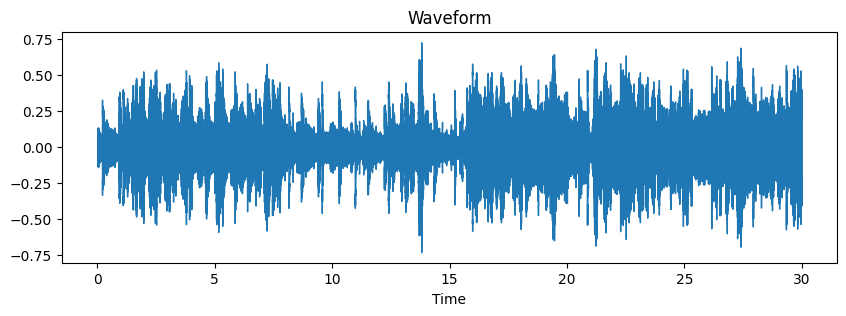

In [9]:
plt.title('Waveform')
librosa.display.waveshow(y=y,sr=sr)
plt.show()

# Harmonic-Percussive Source Separation

## Harmonics-Percussive Source Separation

In [10]:
def hpss(y, margin=1.0):
    """
    Median-filtering harmonic percussive source separation (HPSS).

    If ``margin = 1.0``, decomposes an input spectrogram ``S = H + P``
    where ``H`` contains the harmonic components,
    and ``P`` contains the percussive components.

    If ``margin > 1.0``, decomposes an input spectrogram ``S = H + P + R``
    where ``R`` contains residual components not included in ``H`` or ``P``.
    """
    y_harm, y_perc = librosa.effects.hpss(y=y, margin=margin)
    out = (y_harm, y_perc)
    return out

In [94]:
y_harm, y_perc = hpss(y, margin=1.5)

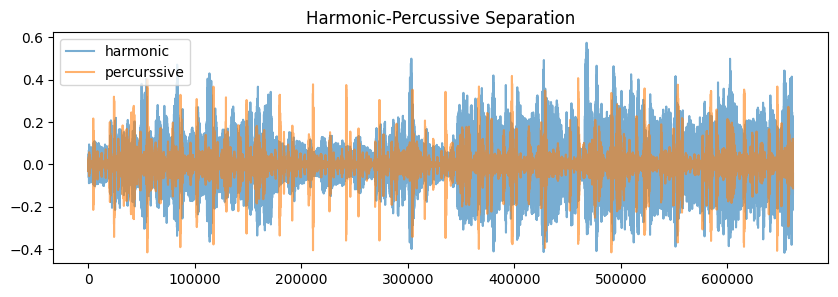

In [95]:
plt.title('Harmonic-Percussive Separation')
plt.plot(y_harm, alpha=.6)
plt.plot(y_perc, alpha=.6)
plt.legend(['harmonic','percurssive'])
plt.show()

In [96]:
# Harmonic
print("Harmonic")
ipd.display(ipd.Audio(data=y_harm, rate=sr))
# Percussive
print("Percussive")
ipd.display(ipd.Audio(data=y_perc, rate=sr))

Harmonic


Percussive


- A percussive part contains vocal and percussive(drums) elements

In [97]:
print(f"- Harmonic y -\n shape: {y_harm.shape}")
print()
print(f"- Percussive y -\n shape: {y_perc.shape}")

- Harmonic y -
 shape: (661500,)

- Percussive y -
 shape: (661500,)


# Spectrogram Features 
- (Frequnecy Domain)

The STFT represents a signal in the time-frequency domain by computing discrete Fourier transforms (DFT) over short overlapping windows.

In [98]:
def stft_mag(y, n_fft=2048, hop_length=None, window='hann', center=True, 
             power='energy', ref=np.max, 
             return_dB=False):
    # STFT
    D = librosa.stft(y=y, n_fft=n_fft, hop_length=hop_length, window='hann', center=True) #stft coefficient
    
    # Amplitude
    if power == 'energy':
        S, P = librosa.magphase(D, power=1) # S = np.abs(D) energy
    elif power == 'power':
        S, P = librosa.magphase(D, power=2) # S = np.abs(D)**2 power
    out = S
    # Convert an amplitude spectrogram to dB-scaled spectrogram
    S_dB = librosa.amplitude_to_db(S, ref=ref)
    if return_dB is True:
        out = S_dB
    return out    

In [99]:
S_dB = stft_mag(y, power='energy', return_dB=True)

In [100]:
print(S_dB.shape)

(1025, 1292)


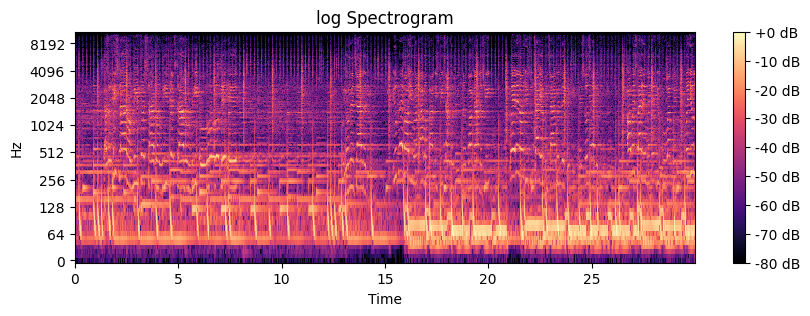

In [101]:
plt.title('log Spectrogram')
librosa.display.specshow(data=S_dB, sr=sr, x_axis='time', y_axis='log')
plt.colorbar(format='%+2.0f dB')
plt.show()

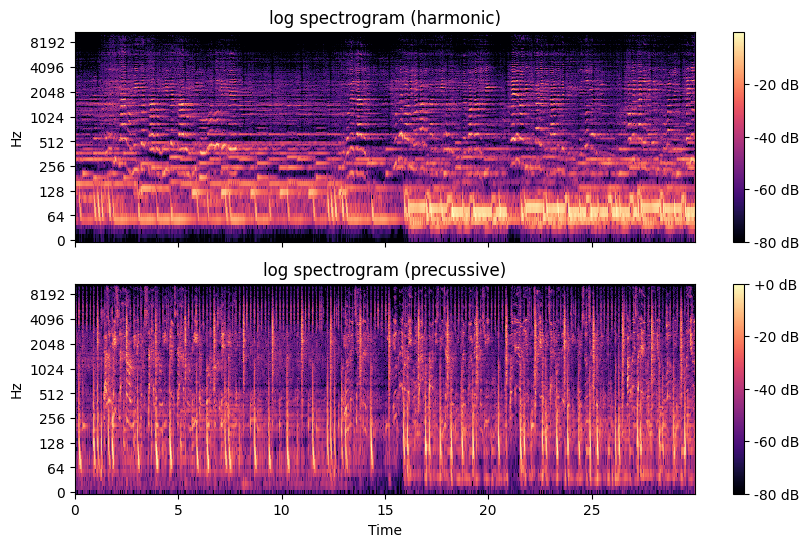

In [102]:
S_dB_harm = stft_mag(y_harm, power='energy', return_dB=True)
S_dB_perc = stft_mag(y_perc, power='energy', return_dB=True)

fig, ax = plt.subplots(2, sharex=True, figsize=(10,6))
img1 = librosa.display.specshow(data=S_dB_harm, sr=sr, x_axis='time', y_axis='log', ax= ax[0])
ax[0].set(title='log spectrogram (harmonic)')
ax[0].label_outer()
fig.colorbar(img1, ax=[ax[0]], format='%+2.0f dB')
img2 = librosa.display.specshow(data=S_dB_perc, sr=sr, x_axis='time', y_axis='log', ax= ax[1])
ax[1].set(title='log spectrogram (precussive)')
fig.colorbar(img2, ax=[ax[1]], format='%+2.0f dB')
plt.show()

## Spectral Centroids

In [103]:
def get_spectral_centroids(y, sr=22050):
    """
    Compute the spectral centroid.

    Each frame of a magnitude spectrogram is normalized and treated as a
    distribution over frequency bins, from which the mean (centroid) is
    extracted per frame.
    """
    # Calculate the Spectral Centroids
    spec_centr = librosa.feature.spectral_centroid(y=y, sr=sr)[0]
    return spec_centr

In [104]:
spec_centr = get_spectral_centroids(y)

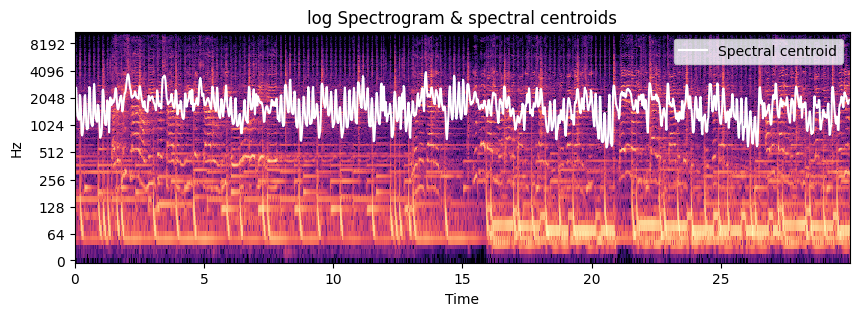

In [105]:
times = librosa.times_like(spec_centr)

fig, ax = plt.subplots()
librosa.display.specshow(S_dB, y_axis='log', x_axis='time', ax=ax)
ax.plot(times, spec_centr.T, label='Spectral centroid', color='w')
ax.legend(loc='upper right')
ax.set(title='log Spectrogram & spectral centroids')
plt.show()

In [106]:
print(f"- Spectral Centroids -\n shape: {spec_centr.shape}")

- Spectral Centroids -
 shape: (1292,)


## Spectral Bandwith

In [107]:
def get_spectral_bandwidth(y, sr=22050, p=2):
    """
    Compute p'th-order spectral bandwidth.
    """
    # Calculate the Spectral Centroids
    spec_bw = librosa.feature.spectral_bandwidth(y=y, sr=sr, p=p)[0]
    return spec_bw

In [108]:
spec_bw = get_spectral_bandwidth(y)

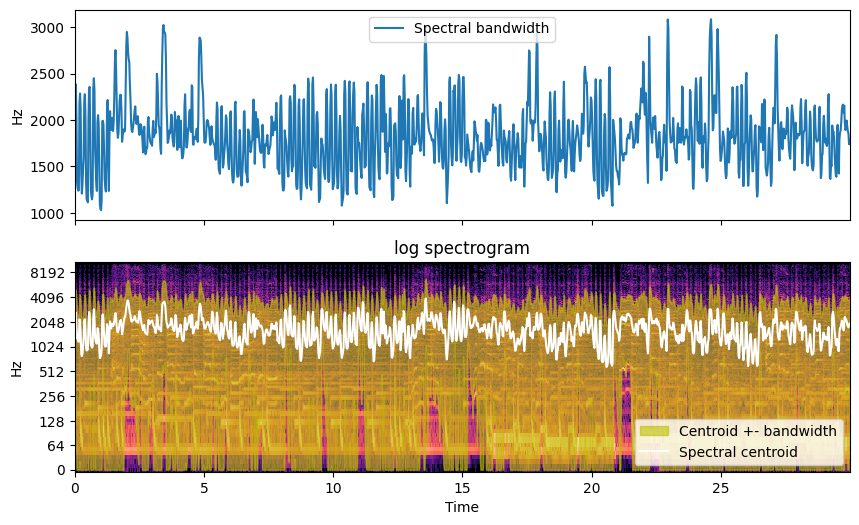

In [170]:
times = librosa.times_like(spec_bw)

fig, ax = plt.subplots(nrows=2, sharex=True, figsize=(10,6))
#ax[0].semilogy(times, spec_bw, label='Spectral bandwidth') #log-scaled
ax[0].plot(times, spec_bw, label='Spectral bandwidth') #log-scaled
ax[0].set(ylabel='Hz', xticks=[], xlim=[times.min(), times.max()])
ax[0].legend()
ax[0].label_outer()
librosa.display.specshow(S_dB, y_axis='log', x_axis='time', ax=ax[1])
ax[1].set(title='log spectrogram')
ax[1].fill_between(times, np.maximum(0, spec_centr - spec_bw),
                np.minimum(spec_centr + spec_bw, sr/2),
                alpha=0.6, label='Centroid +- bandwidth', color='y')
ax[1].plot(times, spec_centr, label='Spectral centroid', color='w')
ax[1].legend(loc='lower right')

In [110]:
print(f"- Spectral Bandwidth -\n shape: {spec_bw.shape}")

- Spectral Bandwidth -
 shape: (1292,)


## Spectral Contrast

In [111]:
def get_spectral_contrast(y, sr=22050, 
                          n_bands=6, quantile=0.02):
    """
    Compute spectral contrast

    Each frame of a spectrogram ``S`` is divided into sub-bands.
    For each sub-band, the energy contrast is estimated by comparing
    the mean energy in the top quantile (peak energy) to that of the
    bottom quantile (valley energy).

    n_bands : int > 1
        number of frequency bands

    Returns
    -------
    contrast : np.ndarray [shape=(..., n_bands + 1, t)]
        each row of spectral contrast values corresponds to a given
        octave-based frequency
    """
    # Calculate the Spectral Centroids
    spec_contrast = librosa.feature.spectral_contrast(y=y, sr=sr, n_bands=n_bands, quantile=quantile)
    return spec_contrast

In [112]:
n_bands = 3
spec_contrast = get_spectral_contrast(y, n_bands=n_bands)

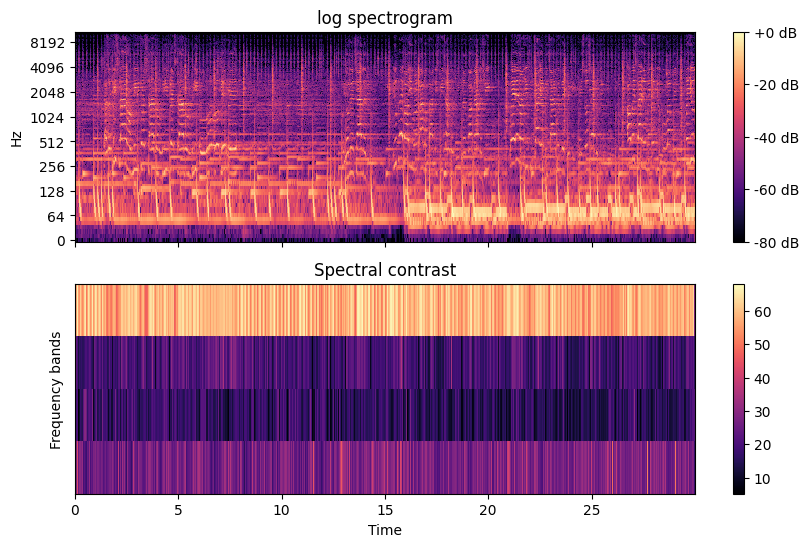

In [113]:
fig, ax = plt.subplots(nrows=2, sharex=True, figsize=(10,6))
img1 = librosa.display.specshow(S_dB,
                         y_axis='log', x_axis='time', ax=ax[0])
fig.colorbar(img1, ax=[ax[0]], format='%+2.0f dB')
ax[0].set(title='log spectrogram')
ax[0].label_outer()
img2 = librosa.display.specshow(spec_contrast, x_axis='time', ax=ax[1])
fig.colorbar(img2, ax=[ax[1]])
ax[1].set(ylabel='Frequency bands', title='Spectral contrast')
plt.show()

In [114]:
print(f"- Spectral Contrast ({n_bands} subbands) -\n shape: {spec_contrast.shape}")

- Spectral Contrast (3 subbands) -
 shape: (4, 1292)


## Spectral Flatness

In [115]:
def get_spectral_flatness(y, n_fft=2048, hop_length=512):
    """
    Compute spectral flatness

    Spectral flatness (or tonality coefficient) is a measure to
    quantify how much noise-like a sound is, as opposed to being
    tone-like. A high spectral flatness (closer to 1.0)
    indicates the spectrum is similar to white noise.
    """
    # Calculate the Spectral Centroids
    spec_flat = librosa.feature.spectral_flatness(y=y, n_fft=n_fft, hop_length=hop_length)[0]
    return spec_flat

In [116]:
spec_flat = get_spectral_flatness(y)

[Text(0.5, 1.0, 'log spectrogram')]

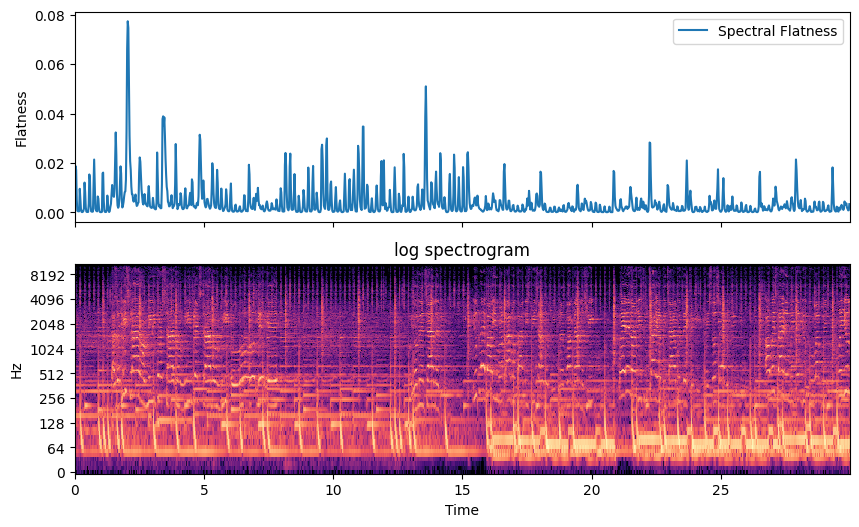

In [117]:
fig, ax = plt.subplots(nrows=2, sharex=True, figsize=(10,6))
ax[0].plot(times, spec_flat, label='Spectral Flatness')
ax[0].set(ylabel='Flatness')
ax[0].legend()
ax[0].label_outer()
librosa.display.specshow(S_dB, y_axis='log', x_axis='time', ax=ax[1])
ax[1].set(title='log spectrogram')

## Spectral Rolloff

In [118]:
def get_spectral_rolloff(y, sr=22050, roll_percent=0.85):
    """Compute roll-off frequency.

    The roll-off frequency is defined for each frame as the center frequency
    for a spectrogram bin such that at least roll_percent (0.85 by default)
    of the energy of the spectrum in this frame is contained in this bin and
    the bins below.
    """
    spec_rolloff = librosa.feature.spectral_rolloff(y=y, sr=sr, roll_percent=roll_percent)[0]
    return spec_rolloff

In [119]:
spec_rolloff_85 = get_spectral_rolloff(y, roll_percent=0.85)
spec_rolloff_max = get_spectral_rolloff(y, roll_percent=0.99)
spec_rolloff_min = get_spectral_rolloff(y, roll_percent=0.01)

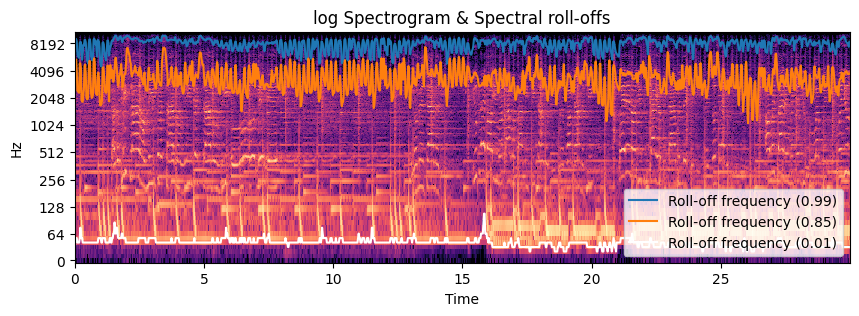

In [120]:
fig, ax = plt.subplots()
librosa.display.specshow(S_dB,
                          y_axis='log', x_axis='time', ax=ax)
ax.plot(times, spec_rolloff_max, label='Roll-off frequency (0.99)')
ax.plot(times, spec_rolloff_85, label=f'Roll-off frequency (0.85)')
ax.plot(times, spec_rolloff_min, color='w', label='Roll-off frequency (0.01)')
ax.legend(loc='lower right')
ax.set(title='log Spectrogram & Spectral roll-offs')
plt.show()

In [121]:
print(f"- Spectral Roll-off -\n shape: {spec_rolloff_max.shape}")

- Spectral Roll-off -
 shape: (1292,)


## Spectral Polynomial Coefficients

In [122]:
def get_spectral_poly(y, sr=22050, order=1):
    """
    Get coefficients of fitting an nth-order polynomial to the columns
    of a spectrogram.
    """
    spec_poly = librosa.feature.poly_features(y=y, sr=sr, order=order)
    return spec_poly

In [123]:
# Fit a degree-0 polynomial (constant) to each frame
spec_poly_0 = get_spectral_poly(y, order=0)

# Fit a linear polynomial to each frame
spec_poly_1 = get_spectral_poly(y, order=1)

# Fit a quadratic to each frame
spec_poly_2 = get_spectral_poly(y, order=2)

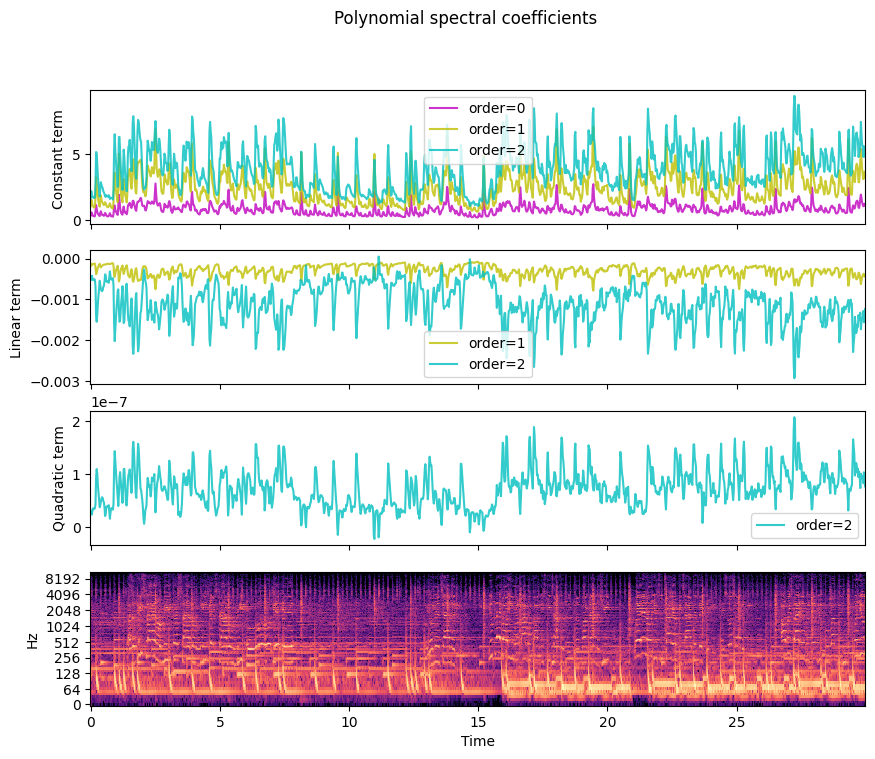

In [124]:
fig, ax = plt.subplots(nrows=4, sharex=True, figsize=(10, 8))
plt.suptitle('Polynomial spectral coefficients')
ax[0].plot(times, spec_poly_0[0], label='order=0', alpha=0.8, c='m')
ax[0].plot(times, spec_poly_1[1], label='order=1', alpha=0.8, c='y')
ax[0].plot(times, spec_poly_2[2], label='order=2', alpha=0.8, c='c')
ax[0].legend()
ax[0].label_outer()
ax[0].set(ylabel='Constant term ')
ax[1].plot(times, spec_poly_1[0], label='order=1', alpha=0.8, c='y')
ax[1].plot(times, spec_poly_2[1], label='order=2', alpha=0.8, c='c')
ax[1].set(ylabel='Linear term')
ax[1].label_outer()
ax[1].legend()
ax[2].plot(times, spec_poly_2[0], label='order=2', alpha=0.8, c='c')
ax[2].set(ylabel='Quadratic term')
ax[2].legend()
librosa.display.specshow(S_dB,
                         y_axis='log', x_axis='time', ax=ax[3])
plt.show()

In [125]:
print(f"- Spectral Polynomial Coefficients (order=1) -\n shape: {spec_poly_1.shape}")

- Spectral Polynomial Coefficients (order=1) -
 shape: (2, 1292)


## overall

- all features are frequency domain, therefore they have same number of rows.

In [126]:
spec_features = [spec_centr, spec_bw, spec_rolloff_max, spec_rolloff_min, spec_flat]
for i in range(n_bands+1):
    spec_features.append(spec_contrast[i])
    
spec_features_columns = ['spectral_centroid', 'spectral_bandwidth',
                         'spectral_rolloff_max', 'spectral_rolloff_min', 
                         'spectral_flatness']
for i in range(1,n_bands+2):
    spec_features_columns.append(f'spectral_contrast_{i}')
    
df_spec_feat = pd.DataFrame(np.array(spec_features).T, columns=spec_features_columns)

In [127]:
df_stats(df_spec_feat)

,mean,std,skew,kurt,max,min,count
spectral_centroid,1704.781707,575.624276,0.557229,0.316061,3948.294550,579.584452,1292
spectral_bandwidth,1837.105693,361.885770,0.549738,0.591176,3087.031968,1028.428875,1292
spectral_rolloff_max,8160.025657,1107.422015,-0.937578,0.201508,9991.406250,4521.972656,1292
spectral_rolloff_min,42.416410,9.232413,0.935348,4.697212,107.666016,21.533203,1292
spectral_flatness,0.004344,0.007071,4.206077,27.012189,0.077358,0.000038,1292
spectral_contrast_1,27.582683,5.230371,1.136372,3.496139,58.284991,9.229026,1292
spectral_contrast_2,15.731814,4.341408,0.298685,0.334869,32.658690,5.159500,1292
spectral_contrast_3,19.476319,4.653535,0.168277,0.258412,36.012949,6.039422,1292
spectral_contrast_4,58.048614,4.454552,-0.520153,1.139291,68.118507,29.251129,1292


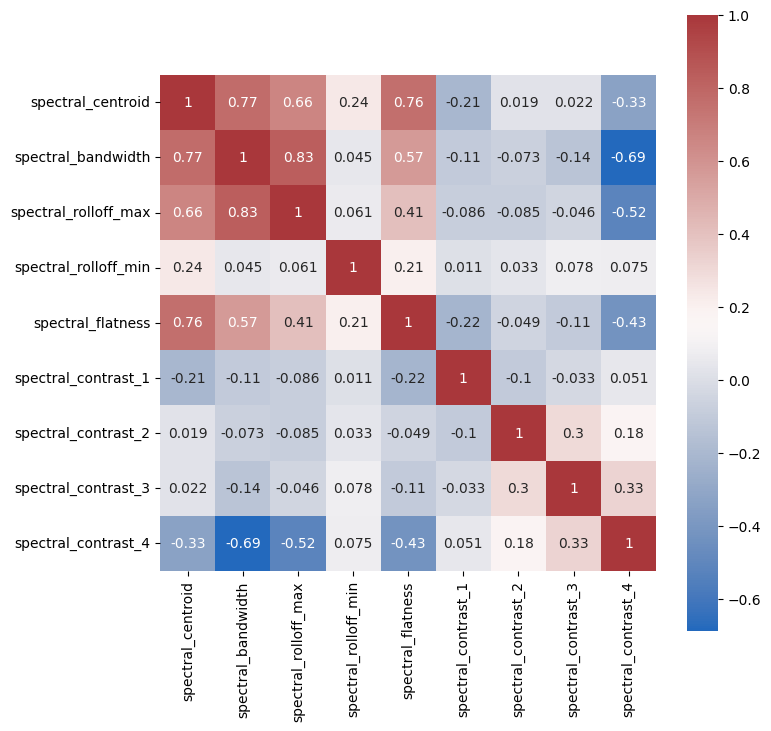

In [128]:
plt.figure(figsize=(8,8))
sns.heatmap(df_spec_feat.corr(),cmap='vlag',square=True, annot=True)
plt.show()

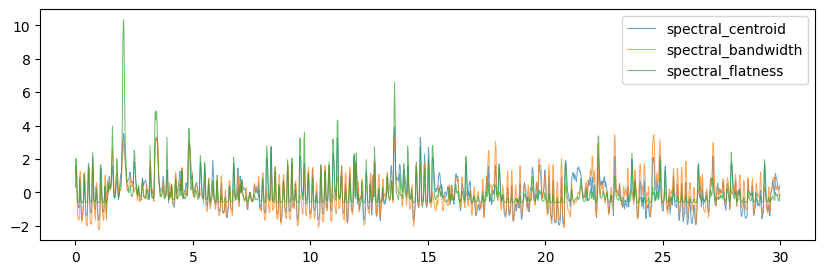

In [129]:
df_spec_feat_scaled = pd.DataFrame(preprocessing.scale(df_spec_feat), columns=spec_features_columns)
df_ = df_spec_feat_scaled[['spectral_centroid','spectral_bandwidth','spectral_flatness']]
plt.plot(times, df_, linewidth=.7, alpha=.7)
plt.legend(df_)
plt.show()

# Mel Spectorgram Features - MFCC
(Frequency Domain)

The Mel spectrogram is a spectrogram with a Mel scale on the y axis.

In [130]:
mel_S = librosa.feature.melspectrogram(y=y, sr=sr)
mel_S_dB = librosa.amplitude_to_db(mel_S, ref=np.max)

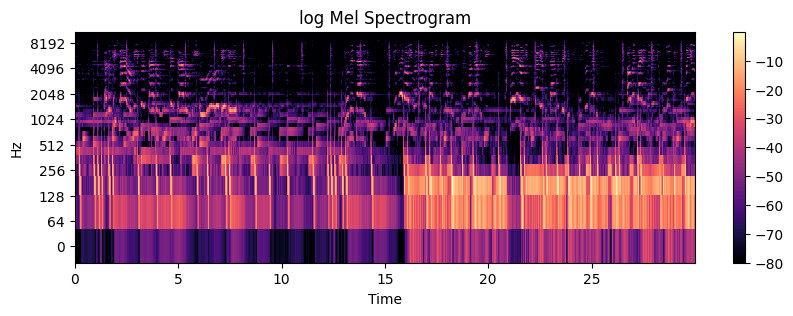

In [131]:
plt.title('log Mel Spectrogram')
librosa.display.specshow(mel_S_dB, sr=sr, x_axis = 'time', y_axis = 'log')
plt.colorbar()
plt.show()

## MFCC (Mel-Frequency Cepstral Coefficients)

In [132]:
def get_mfcc(y, sr=22050, n_mfcc=20):
    mfccs = librosa.feature.mfcc(y=y, sr=sr, n_mfcc=n_mfcc)
    return mfccs

In [133]:
n_mfcc = 12
mfccs = get_mfcc(y, n_mfcc=n_mfcc)

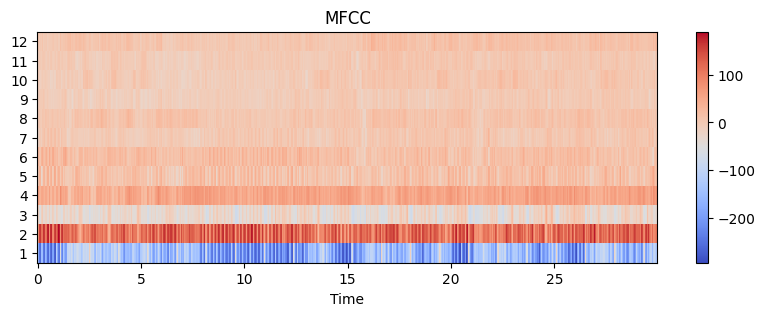

In [134]:
fig, ax = plt.subplots()
img = librosa.display.specshow(mfccs, x_axis='time', ax=ax)
fig.colorbar(img, ax=ax)
ax.set(title='MFCC')
ax.set_yticks(range(0,n_mfcc), labels=range(1,n_mfcc+1))
plt.show()

In [135]:
df_mfcc = pd.DataFrame(np.array(mfccs).T, columns=[f"mfcc_{i}" for i in range(1,n_mfcc+1)])

<AxesSubplot: >

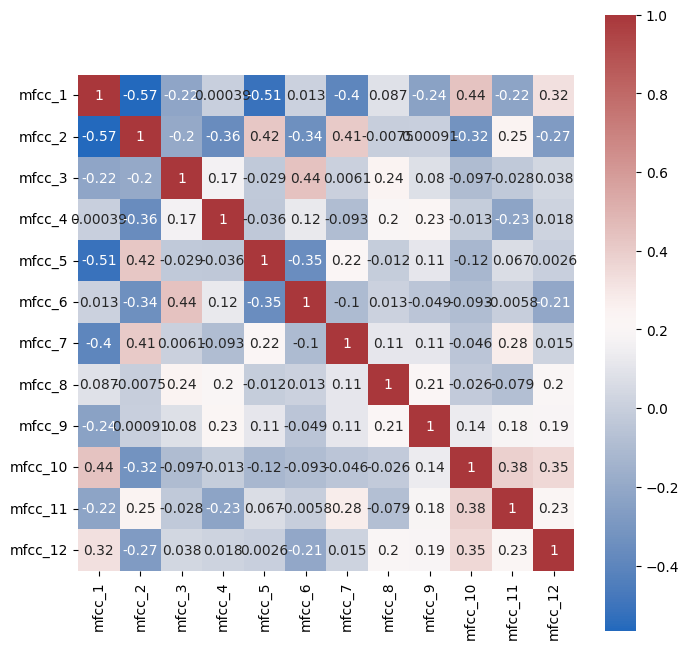

In [136]:
plt.figure(figsize=(8,8))
sns.heatmap(df_mfcc.corr(),cmap='vlag',square=True, annot=True)

<AxesSubplot: >

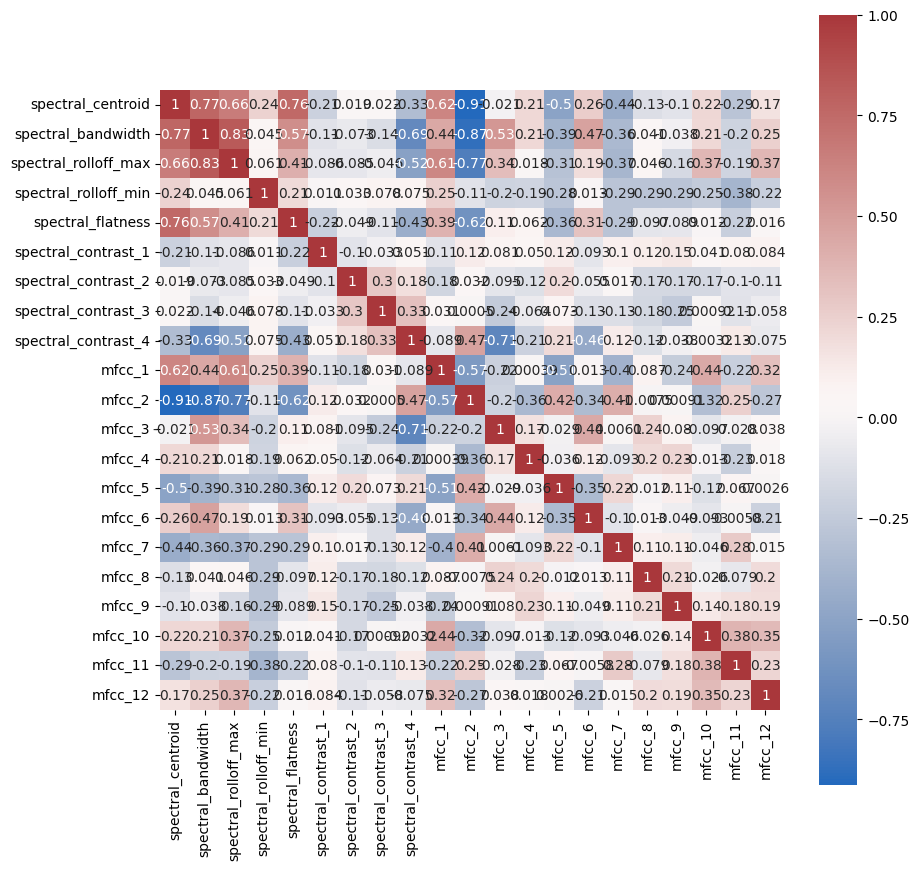

In [137]:
plt.figure(figsize=(10,10))
sns.heatmap(pd.concat([df_spec_feat,df_mfcc],axis=1).corr(),cmap='vlag',square=True, annot=True)

- MFCC 2 is highly correlated with spectral centroid.

# Chromagram Features
(consists of 12 chromas)
- use harmonic part

## Chromagram STFT, CQT, CENS

In [138]:
def get_chromagram(y, sr=22050, hop_length=512, n_chroma=12, method='stft'):
    if method=='stft':
        chromagram = librosa.feature.chroma_stft(y=y, sr=sr, hop_length=hop_length, n_chroma=n_chroma)
    elif method=='cqt':
        chromagram = librosa.feature.chroma_cqt(y=y, sr=sr, hop_length=hop_length, n_chroma=n_chroma)
    elif method=='cens':
        chromagram = librosa.feature.chroma_cens(y=y, sr=sr, hop_length=hop_length, n_chroma=n_chroma)
    else:
        raise Exception("method: ['stft','cqt','cens']")
    return chromagram

In [139]:
# Chromogram
chromagram = get_chromagram(y)
chromagram_harm = get_chromagram(y_harm)
chromagram_perc = get_chromagram(y_perc)

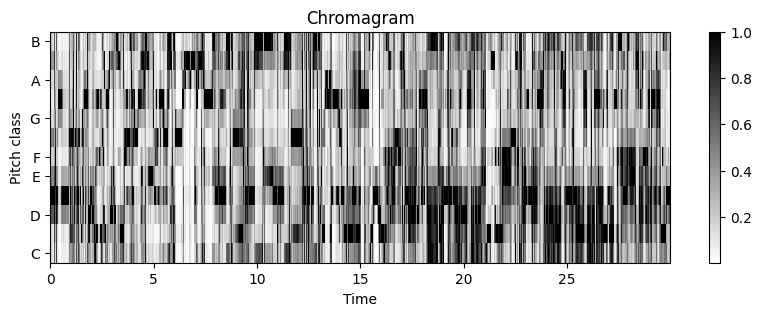

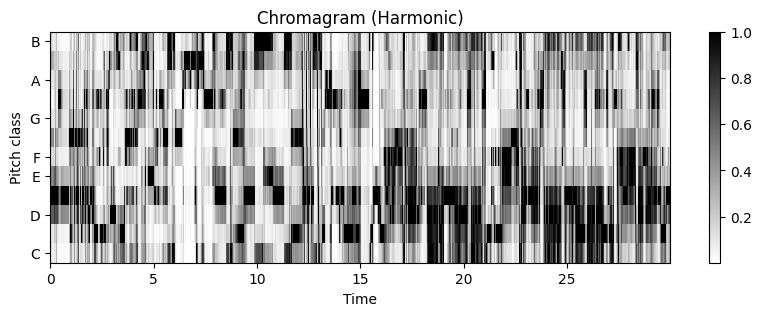

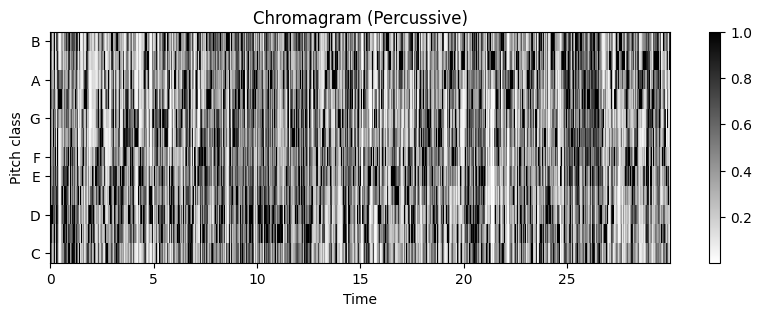

In [140]:
plt.title("Chromagram")
librosa.display.specshow(chromagram, y_axis='chroma', x_axis='time', cmap='gray_r')
plt.colorbar()
plt.show()
plt.title("Chromagram (Harmonic)")
librosa.display.specshow(chromagram_harm, y_axis='chroma', x_axis='time', cmap='gray_r')
plt.colorbar()
plt.show()
plt.title("Chromagram (Percussive)")
librosa.display.specshow(chromagram_perc, y_axis='chroma', x_axis='time', cmap='gray_r')
plt.colorbar()
plt.show()

- It is better idea to get chromagram from only harmonic-separated part.

In [141]:
chromagram_stft = get_chromagram(y_harm, method='stft')
chromagram_cqt = get_chromagram(y_harm, method='cqt')
chromagram_cens = get_chromagram(y_harm, method='cens')

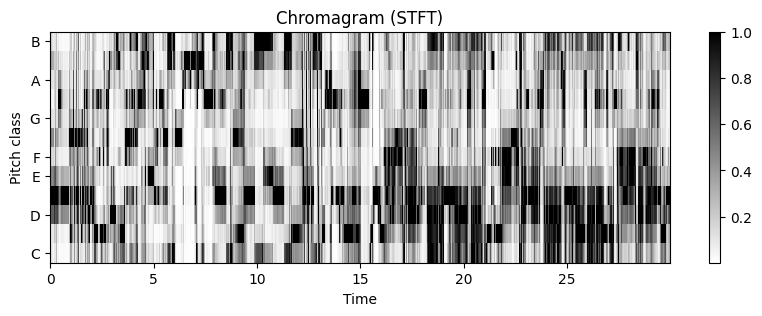

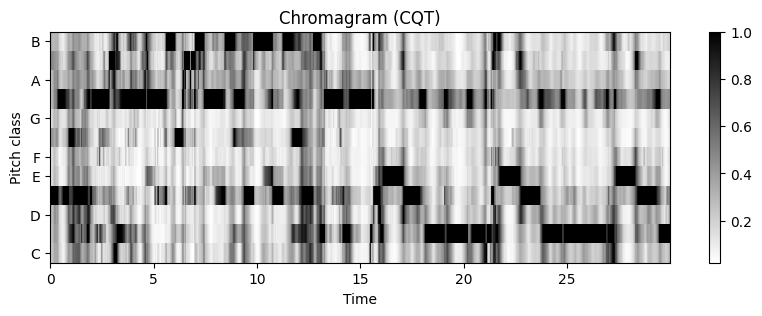

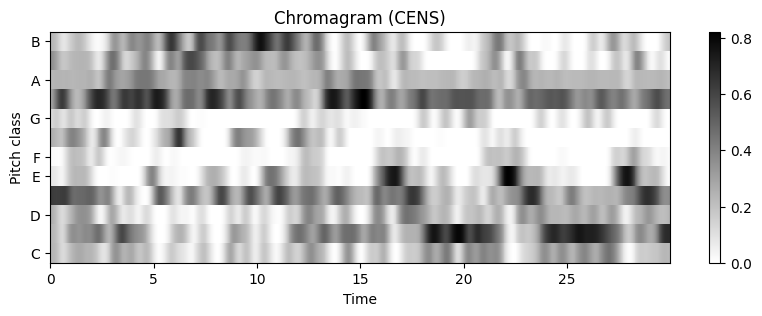

In [142]:
plt.title("Chromagram (STFT)")
librosa.display.specshow(chromagram_stft, y_axis='chroma', x_axis='time', cmap='gray_r')
plt.colorbar()
plt.show()
plt.title("Chromagram (CQT)")
librosa.display.specshow(chromagram_cqt, y_axis='chroma', x_axis='time', cmap='gray_r')
plt.colorbar()
plt.show()
plt.title("Chromagram (CENS)")
librosa.display.specshow(chromagram_cens, y_axis='chroma', x_axis='time', cmap='gray_r')
plt.colorbar()
plt.show()

In [143]:
print('Chromogram shape:', chromagram_stft.shape)

Chromogram shape: (12, 1292)


In [144]:
pitch_class = ['C','C#','D','D#','E','F','F#','G','G#','A','A#','B']

In [145]:
df_chroma_stft = pd.DataFrame(np.array(chromagram_stft).T, columns=[f"chroma_stft_{i}" for i in pitch_class])
df_chroma_cqt = pd.DataFrame(np.array(chromagram_cqt).T, columns=[f"chroma_cqt_{i}" for i in pitch_class])
df_chroma_cens = pd.DataFrame(np.array(chromagram_cens).T, columns=[f"chroma_cens_{i}" for i in pitch_class])

In [146]:
df_chroma = pd.concat([df_chroma_stft, df_chroma_cqt, df_chroma_cens], axis=1)

In [147]:
df_stats(df_chroma)

,mean,std,skew,kurt,max,min,count
chroma_stft_C,0.379072,0.302301,0.641377,-0.794035,1.000000,0.003230,1292
chroma_stft_C#,0.465598,0.350449,0.281077,-1.426944,1.000000,0.003859,1292
chroma_stft_D,0.494364,0.323266,0.228130,-1.200462,1.000000,0.004884,1292
chroma_stft_D#,0.590634,0.353397,-0.233394,-1.465031,1.000000,0.003191,1292
chroma_stft_E,0.379069,0.278409,0.669881,-0.507760,1.000000,0.006214,1292
chroma_stft_F,0.323148,0.293612,1.108784,0.064903,1.000000,0.004351,1292
chroma_stft_F#,0.319624,0.304638,1.051279,-0.066567,1.000000,0.001427,1292
chroma_stft_G,0.233258,0.193474,1.284441,1.607369,1.000000,0.002835,1292
chroma_stft_G#,0.368167,0.334122,0.888107,-0.673157,1.000000,0.002703,1292
chroma_stft_A,0.271041,0.230876,1.498949,1.814119,1.000000,0.000885,1292


## Tonnetz

In [148]:
def get_tonnetz(y,sr=22050):
    """
    Computes the tonal centroid features (tonnetz)

    """
    tonnetz = librosa.feature.tonnetz(y=y, sr=sr)
    return tonnetz

In [149]:
tonnetz = get_tonnetz(y_harm)

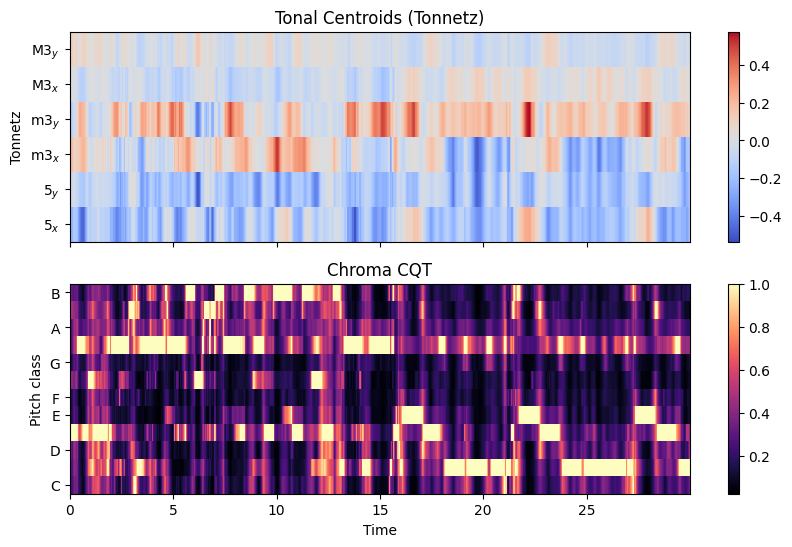

In [150]:
fig, ax = plt.subplots(nrows=2, sharex=True, figsize=(10,6))
img1 = librosa.display.specshow(tonnetz,
                                y_axis='tonnetz', x_axis='time', ax=ax[0])
ax[0].set(title='Tonal Centroids (Tonnetz)')
ax[0].label_outer()
img2 = librosa.display.specshow(chromagram_cqt,
                                y_axis='chroma', x_axis='time', ax=ax[1])
ax[1].set(title='Chroma CQT')
fig.colorbar(img1, ax=[ax[0]])
fig.colorbar(img2, ax=[ax[1]])

In [151]:
tonnetz_class =['fifth_x','fifth_y','minor_x','minor_y','major_x','major_y']

In [152]:
df_tonnetz = pd.DataFrame(np.array(tonnetz.T), columns=[f'tonnetz_{i}' for i in tonnetz_class])
df_stats(df_tonnetz)

,mean,std,skew,kurt,max,min,count
tonnetz_fifth_x,-0.143749,0.141859,0.402158,-0.028445,0.258107,-0.523492,1292
tonnetz_fifth_y,-0.156057,0.104221,-0.526591,0.062419,0.043048,-0.537997,1292
tonnetz_minor_x,-0.012927,0.172644,-0.172835,0.026780,0.517868,-0.504822,1292
tonnetz_minor_y,0.123784,0.156124,0.196570,0.467592,0.577589,-0.414155,1292
tonnetz_major_x,-0.013855,0.067815,-0.064081,-0.293321,0.148989,-0.199834,1292
tonnetz_major_y,-0.009870,0.054806,0.388470,-0.478328,0.161418,-0.129328,1292


# Energy-based Features

## Zero Crossing Rate

In [153]:
def get_zero_crossing_rate(y):
    """
    Compute the zero-crossing rate of an audio time series
    """
    zcr = librosa.feature.zero_crossing_rate(y=y)[0]
    return zcr

In [154]:
n_zc = np.sum(librosa.zero_crossings(y))
n_zc

45992

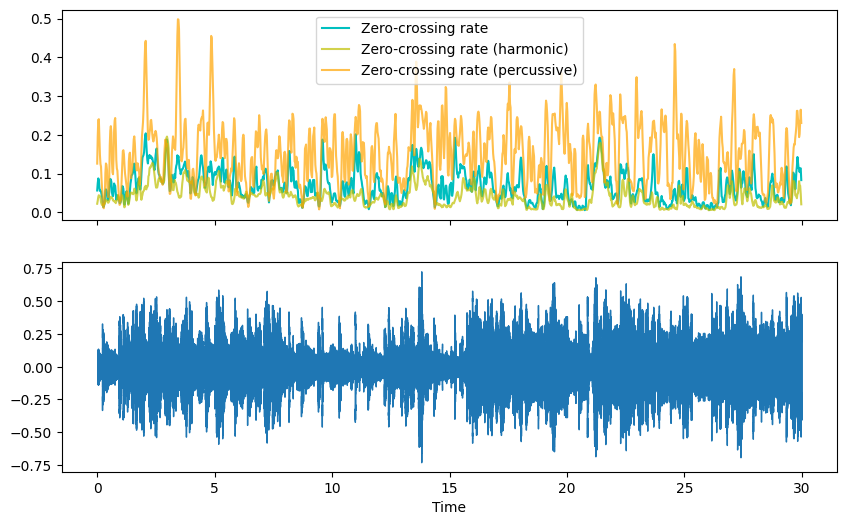

In [155]:
zcr = get_zero_crossing_rate(y=y)
zcr_harm = get_zero_crossing_rate(y=y_harm)
zcr_perc = get_zero_crossing_rate(y=y_perc)

fig, ax = plt.subplots(2, sharex=True, figsize=(10,6))
ax[0].plot(times, zcr, c='c', alpha=1)
ax[0].plot(times, zcr_harm,  c='y', alpha=0.7)
ax[0].plot(times, zcr_perc,  c='orange', alpha=0.7)
ax[0].legend(['Zero-crossing rate','Zero-crossing rate (harmonic)','Zero-crossing rate (percussive)'])
librosa.display.waveshow(y=y,sr=sr,ax=ax[1])
ax[1].set_xlabel('Time')
plt.show()


In [156]:
zcrs = np.array([zcr,zcr_harm,zcr_perc]).T
df_stats(pd.DataFrame(zcrs, columns=['zero_crossing_rate','zero_crossing_rate_harm','zero_crossing_rate_perc']))

,mean,std,skew,kurt,max,min,count
zero_crossing_rate,0.069400,0.039877,0.673311,-0.064376,0.204102,0.005859,1292
zero_crossing_rate_harm,0.042487,0.029311,1.535481,3.638225,0.195801,0.005859,1292
zero_crossing_rate_perc,0.153051,0.079639,0.611795,0.771918,0.498535,0.007812,1292


## RMS

root-mean-square (RMS) value for each frame

In [157]:
def get_rms(y, frame_length=2048, hop_length=512):
    rms = librosa.feature.rms(y=y, frame_length=frame_length, hop_length=hop_length)[0]
    return rms

In [158]:
rms = get_rms(y)
rms_harm = get_rms(y_harm)
rms_perc = get_rms(y_perc)

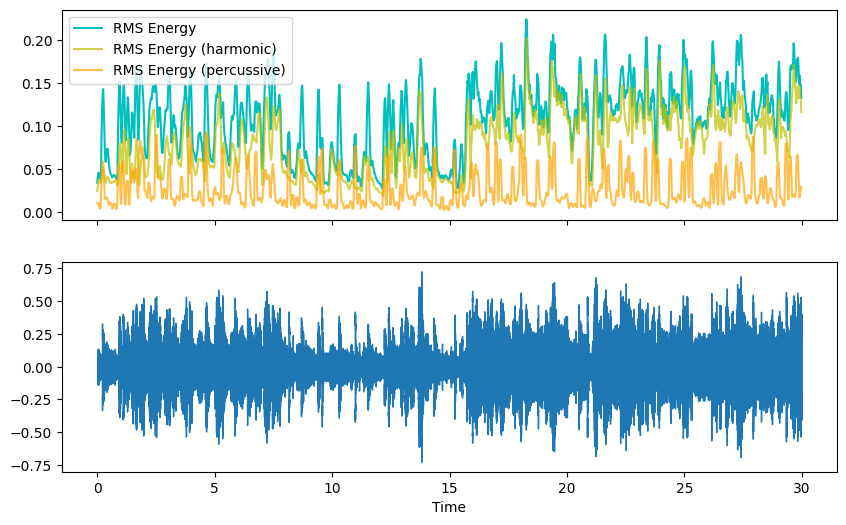

In [159]:
fig, ax = plt.subplots(2, sharex=True, figsize=(10,6))
ax[0].plot(times, rms, label='RMS Energy', c='c', alpha=1)
ax[0].plot(times, rms_harm, label='RMS Energy (harmonic)', c='y', alpha=0.7)
ax[0].plot(times, rms_perc, label='RMS Energy (percussive)', c='orange', alpha=0.7)
ax[0].legend()
librosa.display.waveshow(y=y,sr=sr,ax=ax[1])
ax[1].set_xlabel('Time')
plt.show()

In [160]:
df_rms = pd.DataFrame(np.array([rms,rms_harm,rms_perc]).T, columns=['rms','rms_harm','rms_perc'])
df_stats(df_rms)

,mean,std,skew,kurt,max,min,count
rms,0.109174,0.041451,-0.092255,-0.670425,0.224069,0.027328,1292
rms_harm,0.080283,0.035784,0.256794,-0.671420,0.201921,0.018057,1292
rms_perc,0.026823,0.021580,1.139348,0.238307,0.098741,0.001938,1292


# Rhythm Features

In [161]:
oenv = librosa.onset.onset_strength(y=y_perc, sr=sr)
tempogram = librosa.feature.tempogram(onset_envelope=oenv, sr=sr)

# Compute global onset autocorrelation
ac_global = librosa.autocorrelate(oenv, max_size=tempogram.shape[0])
ac_global = librosa.util.normalize(ac_global)

# Estimate the global tempo for display purposes
tempo = librosa.beat.tempo(onset_envelope=oenv, sr=sr)[0]

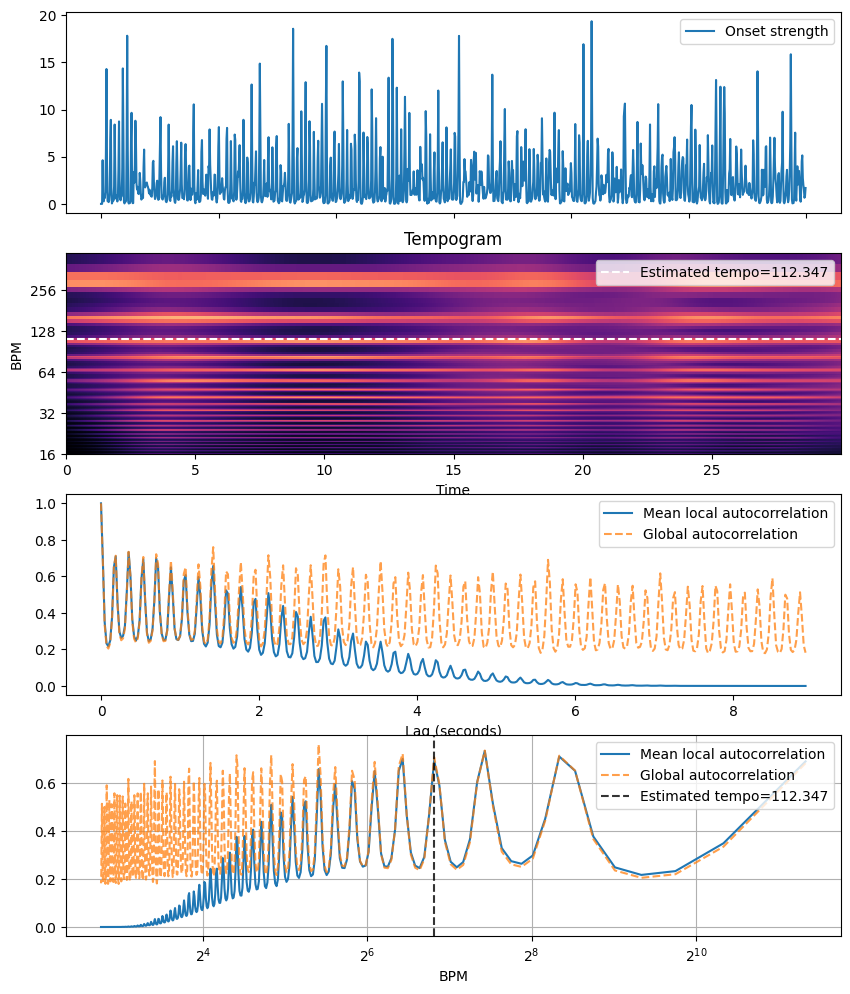

In [162]:
hop_length=512
times = librosa.times_like(oenv, sr=sr, hop_length=hop_length)

fig, ax = plt.subplots(nrows=4, figsize=(10, 12))

ax[0].plot(times, oenv, label='Onset strength')
ax[0].label_outer()
ax[0].legend()

librosa.display.specshow(tempogram, sr=sr, hop_length=hop_length,
                         x_axis='time', y_axis='tempo', cmap='magma',
                         ax=ax[1])
ax[1].axhline(tempo, color='w', linestyle='--', alpha=1,
            label='Estimated tempo={:g}'.format(tempo))
ax[1].legend(loc='upper right')
ax[1].set(title='Tempogram')

x = np.linspace(0, tempogram.shape[0] * float(hop_length) / sr,
                num=tempogram.shape[0])
ax[2].plot(x, np.mean(tempogram, axis=1), label='Mean local autocorrelation')
ax[2].plot(x, ac_global, '--', alpha=0.75, label='Global autocorrelation')
ax[2].set(xlabel='Lag (seconds)')
ax[2].legend()

freqs = librosa.tempo_frequencies(tempogram.shape[0], hop_length=hop_length, sr=sr)
ax[3].semilogx(freqs[1:], np.mean(tempogram[1:], axis=1),
             label='Mean local autocorrelation', base=2)
ax[3].semilogx(freqs[1:], ac_global[1:], '--', alpha=0.75,
             label='Global autocorrelation', base=2)
ax[3].axvline(tempo, color='black', linestyle='--', alpha=.8,
            label='Estimated tempo={:g}'.format(tempo))
ax[3].legend()
ax[3].set(xlabel='BPM')
ax[3].grid(True)

## Onset strength

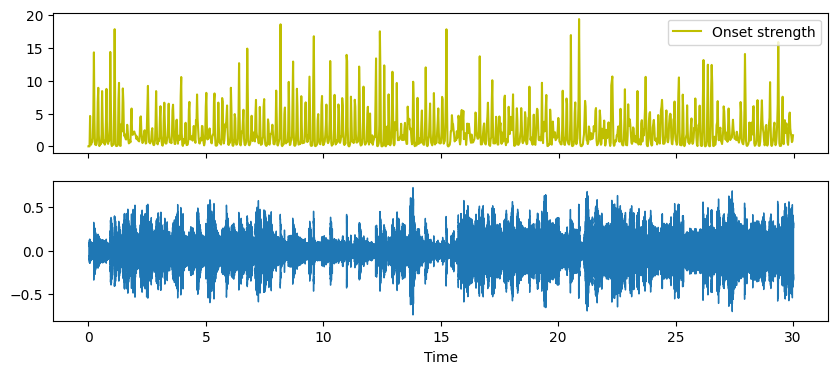

In [163]:
onset_env = librosa.onset.onset_strength(y=y_perc, sr=sr)

fig, ax = plt.subplots(nrows=2, figsize=(10, 4))
ax[0].plot(times, onset_env, label='Onset strength', c='y')
ax[0].label_outer()
ax[0].legend()
librosa.display.waveshow(y=y, sr=sr, x_axis='time', ax=ax[1])

## BPM

In [164]:
def get_bpm(y, sr=22050, start_bpm=100, units='time', return_beats=False):
    tempo, beats = librosa.beat.beat_track(y=y_perc, sr=sr, start_bpm= start_bpm, units=units)
    out = tempo
    if return_beats is True:
        out = (tempo, beats)
    return out

In [165]:
bpm, beats = get_bpm(y_perc, start_bpm=100, return_beats=True)

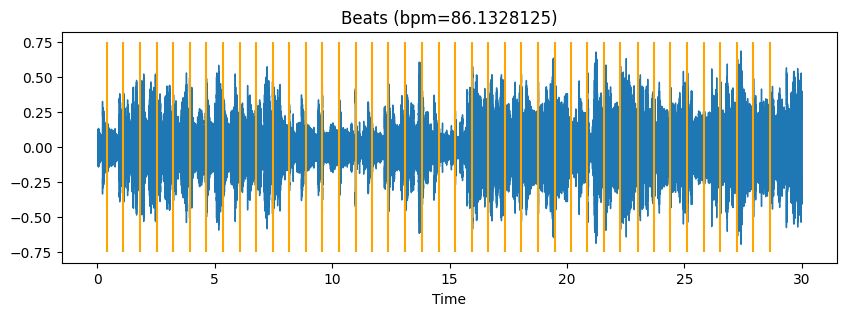

In [166]:
plt.title(f'Beats (bpm={bpm})')
librosa.display.waveshow(y=y, sr=sr)
plt.vlines(beats, ymin=-.75, ymax=.75, color='orange')
plt.show()

- more possible BPMs!

In [171]:
bpms = []
beatss = []
start_bpms = [60, 120, 200]
for i in start_bpms:
    bpm_, beats_ = get_bpm(y_perc, start_bpm=i, return_beats=True)
    bpms.append(bpm_)
    beatss.append(beats_)

In [172]:
bpms

[42.36039959016394, 86.1328125, 172.265625]

In [173]:
for i in range(len(beatss)):
    clicks = librosa.clicks(times=beatss[i], sr=sr, length=len(y))
    ipd.display(ipd.Audio(y + clicks, rate=sr))